# Data processing and collection



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

%cd /content/gdrive/MyDrive/CPD/Реализация/

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/CPD/Реализация


In [ ]:
!pip install yahooquery

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import yfinance as yf
import datetime

from yahooquery import Screener
import itertools

%config InlineBackend.figure_format = 'retina'

In [ ]:
# download available cryptocurrency tickers from yfinance
s = Screener()
data = s.get_screeners('all_cryptocurrencies_us', count=250)

dicts = data['all_cryptocurrencies_us']['quotes']
symbols = [d['symbol'] for d in dicts]

symbols

['BTC-USD',
 'ETH-USD',
 'USDT-USD',
 'BNB-USD',
 'SOL-USD',
 'USDC-USD',
 'XRP-USD',
 'STETH-USD',
 'TON11419-USD',
 'DOGE-USD',
 'ADA-USD',
 'SHIB-USD',
 'AVAX-USD',
 'TRX-USD',
 'WTRX-USD',
 'WBTC-USD',
 'DOT-USD',
 'BCH-USD',
 'LINK-USD',
 'NEAR-USD',
 'MATIC-USD',
 'LTC-USD',
 'ICP-USD',
 'LEO-USD',
 'DAI-USD',
 'PEPE24478-USD',
 'UNI7083-USD',
 'RNDR-USD',
 'HBAR-USD',
 'FDUSD-USD',
 'WHBAR-USD',
 'ETC-USD',
 'APT21794-USD',
 'BTCB-USD',
 'ATOM-USD',
 'CRO-USD',
 'WEETH-USD',
 'MNT27075-USD',
 'IMX10603-USD',
 'EZETH-USD',
 'XLM-USD',
 'FIL-USD',
 'OKB-USD',
 'WIF-USD',
 'STX4847-USD',
 'KAS-USD',
 'WBETH-USD',
 'AR-USD',
 'OP-USD',
 'GRT6719-USD',
 'ARB11841-USD',
 'MKR-USD',
 'XMR-USD',
 'VET-USD',
 'TAO22974-USD',
 'USDE29470-USD',
 'SUI20947-USD',
 'INJ-USD',
 'THETA-USD',
 'RUNE-USD',
 'FTM-USD',
 'FLOKI-USD',
 'FET-USD',
 'RETH-USD',
 'TIA22861-USD',
 'BONK-USD',
 'BGB-USD',
 'LDO-USD',
 'CORE23254-USD',
 'ALGO-USD',
 'JUP29210-USD',
 'ZBU-USD',
 'SEI-USD',
 'AKT-USD',
 'FL

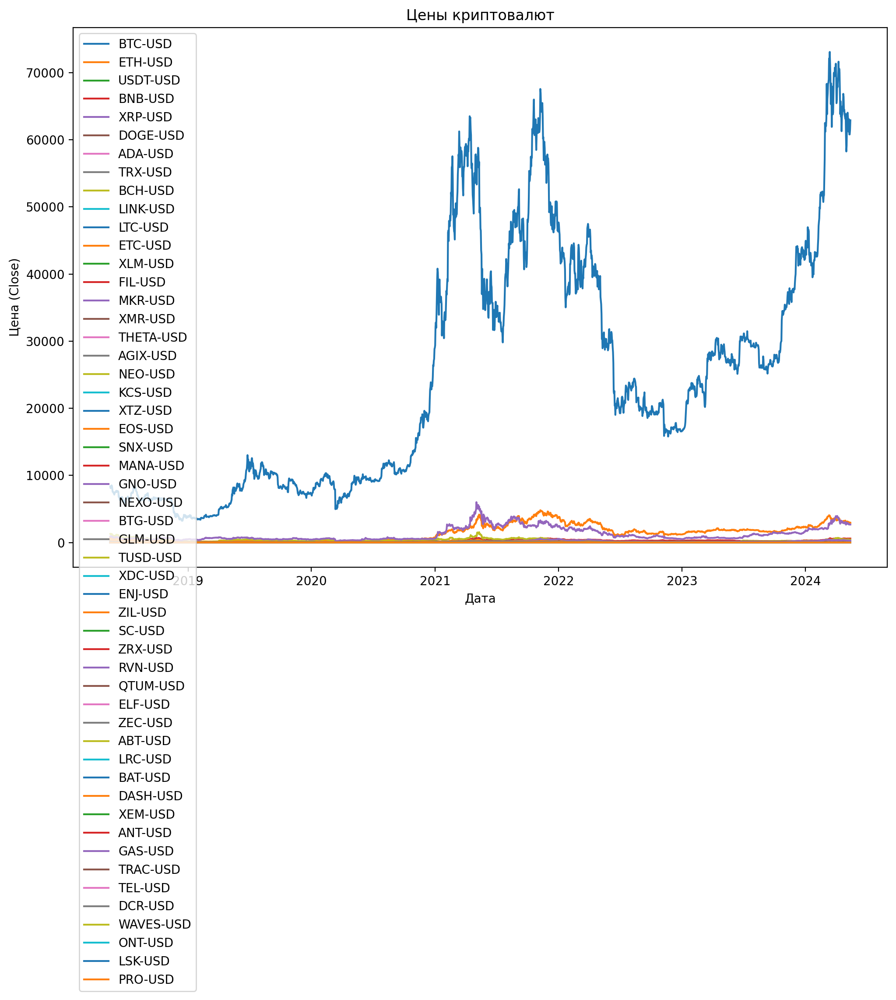

In [ ]:
# Function to download cryptocurrency data from Yahoo Finance
def load_crypto_data(tickers, start_date, end_date, col_name = 'Close'):
    data = {}
    for ticker in tickers:
        crypto = yf.Ticker(ticker)

        # Loading cryptocurrency price data (by selected column)
        crypto_data = crypto.history(start=start_date, end=end_date)[col_name]

        # Check that the cryptocurrency has data for the last 5 years
        if len(crypto_data) >= 365*6:
            data[ticker] = crypto_data

    df = pd.DataFrame(data)

    return df


def visualize_crypto_data(df):

    plt.figure(figsize=(12, 8))
    for ticker in df.columns:
        plt.plot(df.index, df[ticker], label=ticker)
        # plt.plot(df.index, df[ticker])
    plt.title('Цены криптовалют')
    plt.xlabel('Дата')
    plt.ylabel('Цена (Close)')
    plt.legend(loc='upper left')
    plt.show()



def main():
    tickers = symbols
# Define the time period for downloading data
    end_date = datetime.datetime.now()
    start_date = (end_date - datetime.timedelta(days=365*6)).strftime('%Y-%m-%d')

    end_date = end_date.strftime('%Y-%m-%d')

# Loading data about cryptocurrencies
    crypto_data = load_crypto_data(tickers, start_date, end_date)

    crypto_data.to_csv('crypto_values_close.csv')

    visualize_crypto_data(crypto_data)


if __name__ == '__main__':
    main()

**As a result of executing the function, we obtain a dataset of coins for which there was data for the selected period of time**


**We will separately upload data on the volume of coins:**

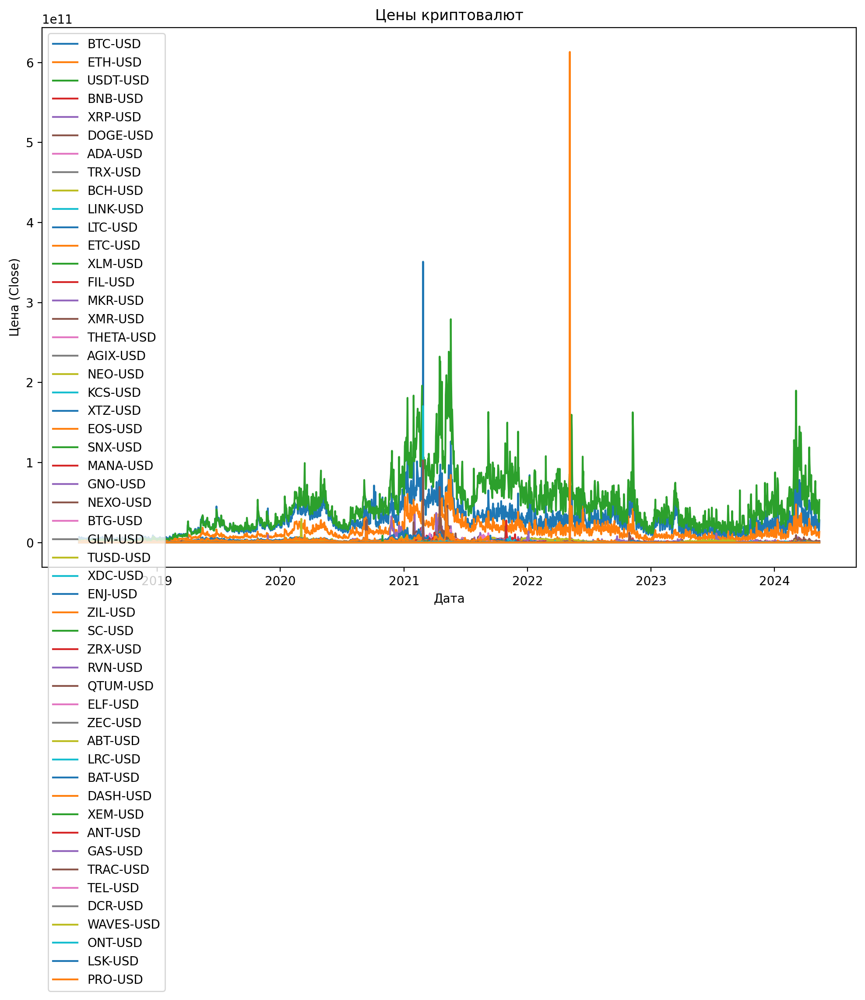

In [ ]:
# save data on trading volume separately
def main():
    tickers = symbols

    end_date = datetime.datetime.now()
    start_date = (end_date - datetime.timedelta(days=365*6)).strftime('%Y-%m-%d')



    end_date = end_date.strftime('%Y-%m-%d')

    crypto_data = load_crypto_data(tickers, start_date, end_date,'Volume')

    crypto_data.to_csv('crypto_values_volume.csv')

    visualize_crypto_data(crypto_data)


if __name__ == '__main__':
    main()

In [ ]:
crypto_values = pd.read_csv("crypto_values_close.csv")
crypto_values['Date'] = pd.to_datetime(crypto_values.Date).dt.date
crypto_values.head()

,Date,BTC-USD,ETH-USD,USDT-USD,BNB-USD,XRP-USD,DOGE-USD,ADA-USD,TRX-USD,BCH-USD,...,XEM-USD,ANT-USD,GAS-USD,TRAC-USD,TEL-USD,DCR-USD,WAVES-USD,ONT-USD,LSK-USD,PRO-USD
0,2018-05-16,8368.830078,707.049988,0.999950,12.2605,0.714081,0.004385,0.256375,0.071954,1280.619995,...,0.326662,4.25121,23.772699,0.305244,0.001933,92.537201,6.14829,7.33611,10.2751,1.29360
1,2018-05-17,8094.319824,672.656982,1.000190,12.4650,0.667310,0.004188,0.243664,0.067437,1206.170044,...,0.303940,4.00194,21.629299,0.267031,0.001863,93.603897,5.77118,6.78867,10.2056,1.25673
2,2018-05-18,8250.969727,694.367004,1.001110,15.1354,0.680294,0.004017,0.245544,0.069387,1207.239990,...,0.312504,3.99391,22.783800,0.282129,0.001889,104.896004,6.04157,6.93431,10.5002,1.25664
3,2018-05-19,8247.179688,696.530029,1.000360,14.2457,0.676713,0.004286,0.243271,0.069144,1184.959961,...,0.307566,3.95651,22.643000,0.275473,0.001962,107.647003,5.90110,7.22546,10.5730,1.22773
4,2018-05-20,8513.250000,715.369019,0.999117,14.1178,0.700244,0.004423,0.256136,0.077269,1291.770020,...,0.321398,3.93427,24.115700,0.257568,0.001955,111.217003,6.07135,7.93965,11.3074,1.32114


In [ ]:
len(crypto_values.columns[1:])

52

**Description of the dataset:**
- data on trading volume and closing prices of 52 coins
- period: 5 years
- daily data
- no passes

## Class wrapper for preprocessing
- calculation of growth
- calculation of overall correlation + visualization
- calculation of monthly correlation + visualization for each coin


***Analysis of the components of the series:***
- smoothing calculation (sliding window) - for the original series and for increments + visualization for each coin
- double exponential smoothing - for the original series and for increments + visualization for each coin
- calculation of correlations (for all time), as well as correlations by month - look at the dynamics of the correlation, which will be used in the future to build a graph

In [ ]:
class CryptoPreproc:
    def __init__(self, data):
        self.data = data

    def returns_calc(self):
        df = self.data


        df_returns = df.drop(columns=['Date']).pct_change()
        df_returns['Date'] = df.Date
        df_returns = df_returns.dropna().reset_index(drop=True)

        return df_returns

    def calculate_overall_correlation(self,df):

        # Calculate the overall correlation between coins
        overall_correlation = df.drop(columns=['Date']).corr()
        return overall_correlation

    def visualize_overall_correlation(self, overall_correlation):
        # Visualization of overall correlation
        plt.figure(figsize=(15, 15))
        plt.imshow(overall_correlation, cmap='coolwarm', interpolation='nearest')
        plt.colorbar()
        plt.title('Overall Correlation')
        plt.xticks(range(len(overall_correlation)), overall_correlation.columns, rotation=45)
        plt.yticks(range(len(overall_correlation)), overall_correlation.columns)
        plt.show()

    def calculate_monthly_correlation(self,df):
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)
        monthly_data = df.groupby(pd.Grouper(freq='M'))

        # Calculate correlation for each month
        monthly_correlation = monthly_data.apply(lambda x: x.corr())

        return monthly_correlation


    def visualize_monthly_correlation(self, monthly_correlation, ticker = 'BTC-USD'):
      tickers = list(monthly_correlation.columns)

      # пары для выбранного тикера
      pairs = [(ticker, t) for t in tickers if t != ticker]
      pairs_to_plot = pairs[:10]

      plt.figure(figsize=(12, 10))

      for i, pair in enumerate(pairs):
          crypto1, crypto2 = pair
          monthly_corr = monthly_correlation.reset_index()
          monthly_corr = monthly_corr[monthly_corr.level_1 == crypto1][['Date',crypto2]]
          plt.plot(monthly_corr.Date, monthly_corr[crypto2], label=pair)

      plt.title('Monthly Correlation Between Cryptocurrencies')
      plt.xlabel('Date')
      plt.ylabel('Correlation')
      plt.xticks(rotation=45)
      plt.legend()
      plt.show()



    def calculate_rolling_mean(self,df,target,window=7):
        roll_mean = df[target].rolling(window=window).mean().shift(window - 1)
        rolling_std =  df[target].rolling(window=window).std().shift(window - 1)


        upper_bond = roll_mean+1.96*rolling_std
        lower_bond = roll_mean-1.96*rolling_std

        plt.figure(figsize=(10,3))
        plt.plot(df['Date'], roll_mean, label=f'Rolling Mean (window={window})')
        plt.plot(df['Date'],upper_bond, "r--", label="Upper Bond / Lower Bond", alpha = 0.7)
        plt.plot(df['Date'],lower_bond, "r--",alpha = 0.7)
        plt.xlabel('Date')

        plt.xticks(rotation=45)
        plt.gca().set_xticks(df['Date'][::100])

        plt.ylabel(f'{target}')
        plt.title(f'Rolling Mean {target}')
        plt.legend(loc="upper left")
        plt.grid(True)
        plt.legend()
        plt.show()




    def double_exponential_smoothing(self, series, alpha, beta):

      level, trend = series[0], series[1] - series[0]
      smoothed = [series[0]]

      for value in series[1:]:
          last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
          trend = beta * (level - last_level) + (1 - beta) * trend
          smoothed.append(level + trend)

      return smoothed


    def double_exp_plot(self,df,column,alphas,betas):
      plt.figure(figsize=(10, 5))
      plt.plot(df['Date'], df[column], label="Actual", color='gray')
      for alpha in alphas:
          for beta in betas:
            smoothed = self.double_exponential_smoothing(df[column], alpha, beta)
            plt.plot(df['Date'], smoothed, label="Alpha {}, beta {}".format(alpha, beta))
      plt.legend(loc="best")
      plt.axis('tight')
      plt.title(f"Double Exponential Smoothing of {column}")
      plt.grid(True)
      plt.show()




In [ ]:
preprocessor = CryptoPreproc(crypto_values)

# Calculate the growth for each coin
returns = preprocessor.returns_calc()
returns.to_csv('returns_crypto.csv', index=False)
returns.head()

,BTC-USD,ETH-USD,USDT-USD,BNB-USD,XRP-USD,DOGE-USD,ADA-USD,TRX-USD,BCH-USD,LINK-USD,...,ANT-USD,GAS-USD,TRAC-USD,TEL-USD,DCR-USD,WAVES-USD,ONT-USD,LSK-USD,PRO-USD,Date
0,-0.032802,-0.048643,0.000240,0.016680,-0.065498,-0.044926,-0.049580,-0.062776,-0.058136,-0.075784,...,-0.058635,-0.090162,-0.125188,-0.036213,0.011527,-0.061336,-0.074623,-0.006764,-0.028502,2018-05-17
1,0.019353,0.032275,0.000920,0.214232,0.019457,-0.040831,0.007716,0.028916,0.000887,0.027886,...,-0.002006,0.053377,0.056540,0.013956,0.120637,0.046852,0.021453,0.028867,-0.000072,2018-05-18
2,-0.000459,0.003115,-0.000749,-0.058783,-0.005264,0.066965,-0.009257,-0.003502,-0.018455,-0.008219,...,-0.009364,-0.006180,-0.023592,0.038645,0.026226,-0.023251,0.041987,0.006933,-0.023006,2018-05-19
3,0.032262,0.027047,-0.001243,-0.008978,0.034773,0.031965,0.052883,0.117508,0.090138,0.000188,...,-0.005621,0.065040,-0.064997,-0.003568,0.033164,0.028851,0.098844,0.069460,0.076084,2018-05-20
4,-0.011072,-0.022572,0.003856,0.042818,-0.026644,-0.034366,-0.028485,0.066120,-0.045000,-0.063585,...,0.022172,-0.019672,-0.048904,-0.017903,0.050154,-0.048747,-0.034936,-0.034871,-0.040291,2018-05-21


#### Посмотрим на приближение каждого ряда скользящим средним

По умолчанию выбрано окно в 7 дней

In [ ]:
# tickers = list(crypto_values.columns[1:])
# for i in range(len(tickers)):
#   preprocessor.calculate_rolling_mean(returns, f'{tickers[i]}')

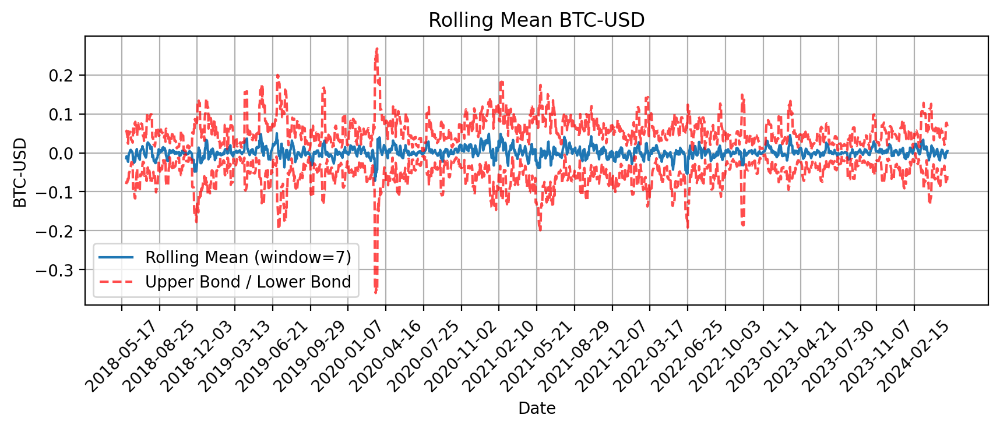

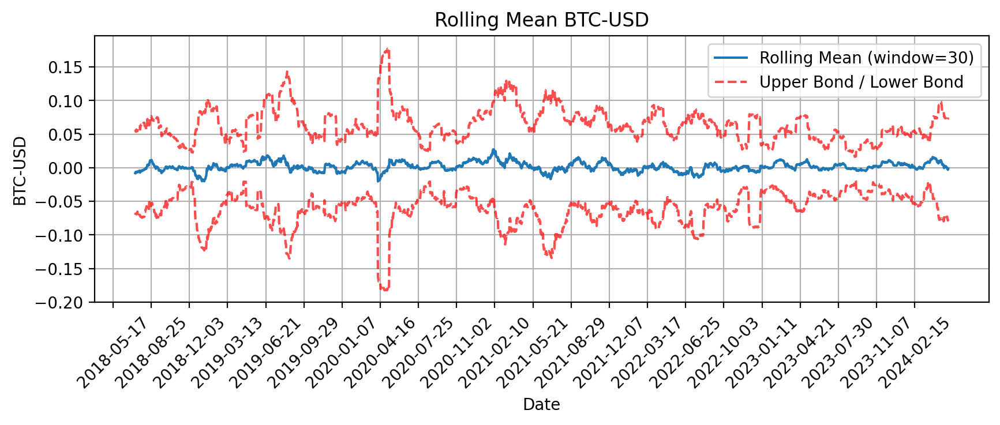

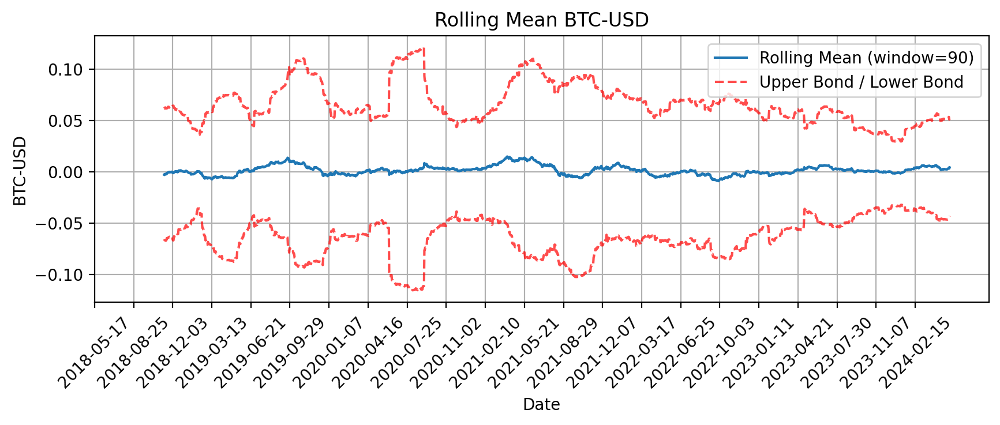

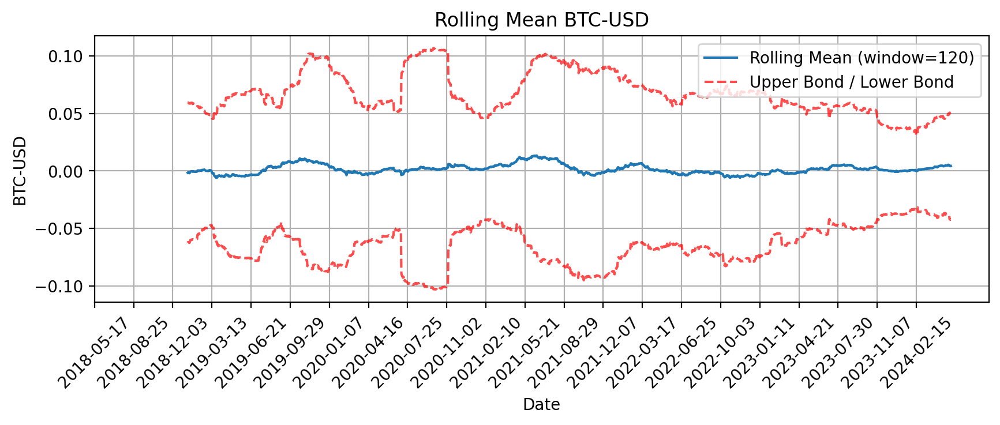

In [ ]:
# сравним для одного тикера
preprocessor.calculate_rolling_mean(returns, 'BTC-USD')
preprocessor.calculate_rolling_mean(returns, 'BTC-USD',window=30)
preprocessor.calculate_rolling_mean(returns, 'BTC-USD',window=90)
preprocessor.calculate_rolling_mean(returns, 'BTC-USD',window=120)

### Расчёт корреляций
***Здесь представлена корреляция за весь рассматриваемый период***

**В основном монеты имеют корреляцию в районе 0.4 - 0.8**

**Но также есть монеты практически с нулевой корреляцией**

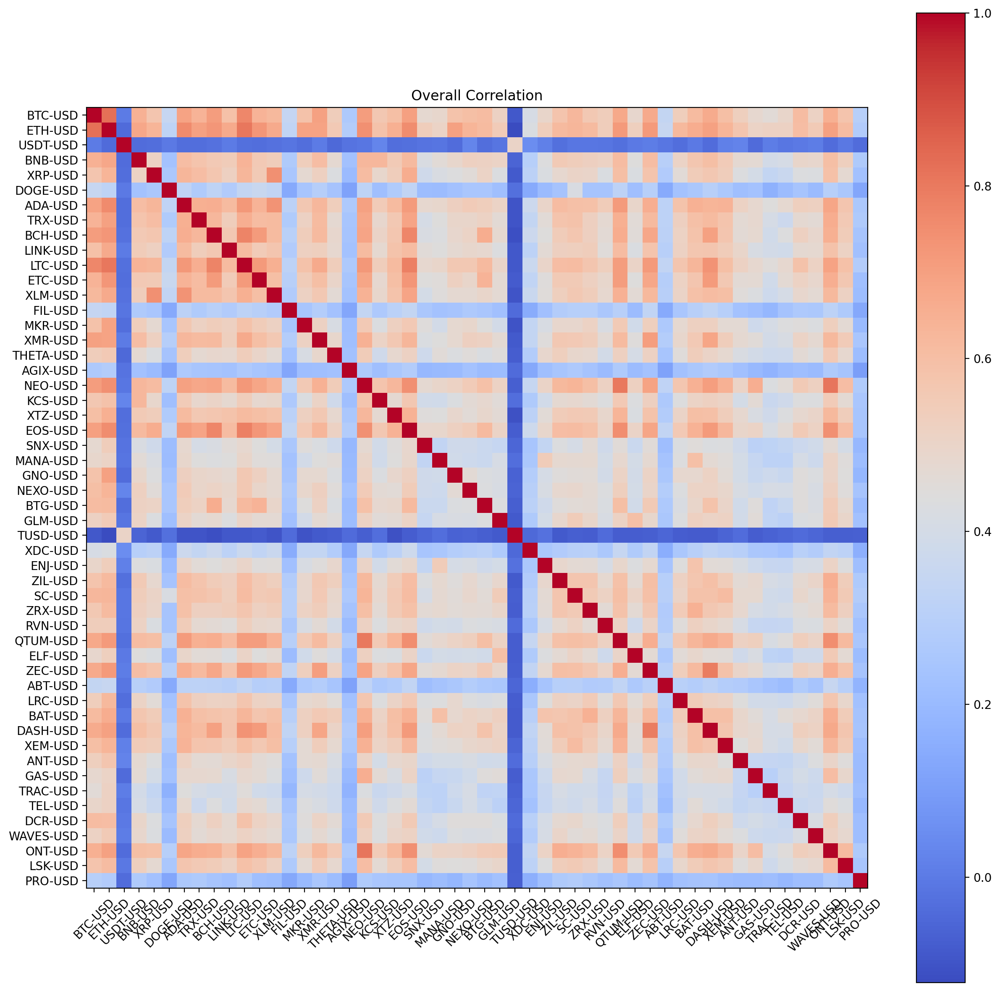

In [ ]:
corr = preprocessor.calculate_overall_correlation(returns)
preprocessor.visualize_overall_correlation(corr)

### Посмотрим на корреляции в динамике

Для примера посмотрим на месячные граффики корреляций для биткоина

Визуальный анализ показывает, что корреляции довольно нестабильны во времени

Большинство монет ведут себя похоже, однако можно выделить отдельные клтеры по поведению: разбросу, знаку и тд.

Для определения параметров графа будем использовать корреляции между монетами

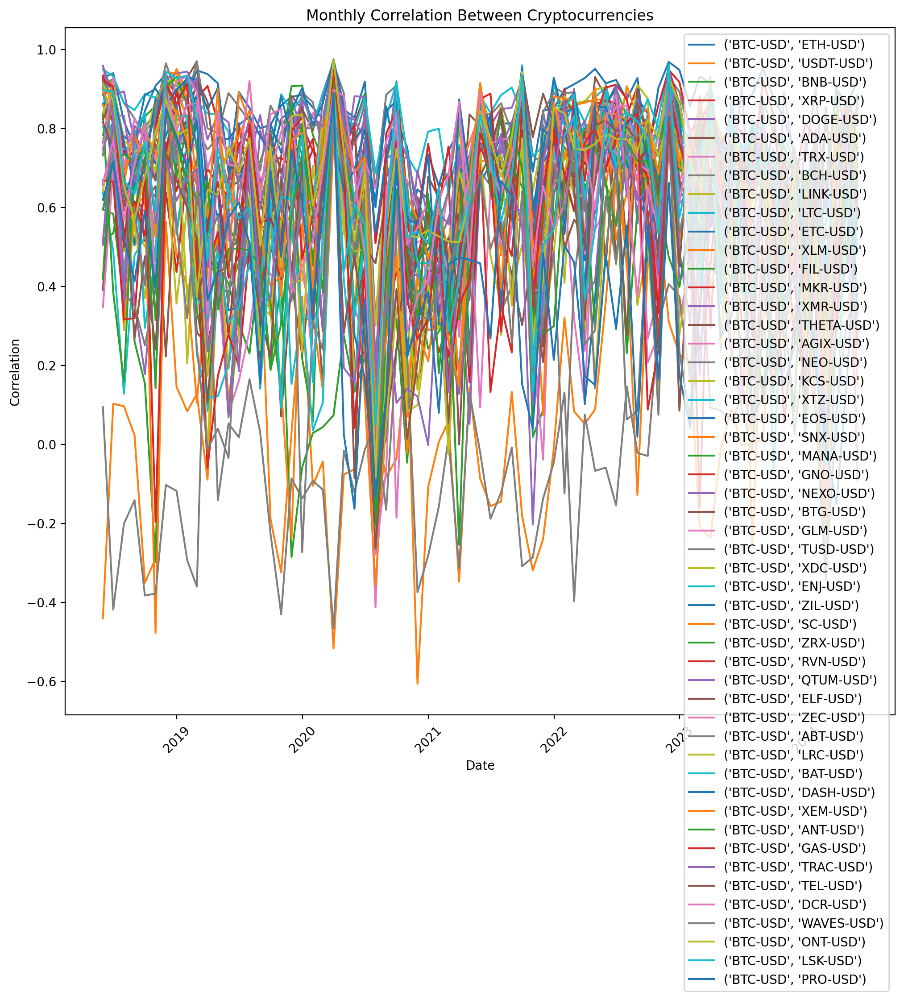

In [ ]:
corr_month = preprocessor.calculate_monthly_correlation(returns)

preprocessor.visualize_monthly_correlation(corr_month)

In [ ]:
corr_month.to_csv('corr_month.csv')
corr_month

BTC-USD   ETH-USD  USDT-USD   BNB-USD   XRP-USD  \
Date                                                                     
2018-05-31 BTC-USD    1.000000  0.928195 -0.439828  0.595184  0.885434   
           ETH-USD    0.928195  1.000000 -0.587348  0.626004  0.957100   
           USDT-USD  -0.439828 -0.587348  1.000000 -0.124469 -0.698289   
           BNB-USD    0.595184  0.626004 -0.124469  1.000000  0.492195   
           XRP-USD    0.885434  0.957100 -0.698289  0.492195  1.000000   
...                        ...       ...       ...       ...       ...   
2024-05-31 DCR-USD    0.561300  0.601948  0.646889  0.300164  0.578051   
           WAVES-USD  0.685733  0.810088  0.675295  0.475882  0.543023   
           ONT-USD    0.790262  0.852907  0.094981  0.855314  0.234712   
           LSK-USD    0.290623  0.440175  0.085466  0.216046  0.525992   
           PRO-USD    0.619414  0.607535  0.328484  0.359814  0.406370   

                      DOGE-USD   ADA-USD   TRX-USD   BCH-USD  LINK-USD  ...  \
Date                                                                    ...   
2018-05-31 BTC-USD    0.764424  0.903736  0.748758  0.909480  0.774136  ...   
           ETH-USD    0.741719  0.938996  0.784907  0.929542  0.894086  ...   
           USDT-USD  -0.368788 -0.579947 -0.350399 -0.697871 -0.564603  ...   
           BNB-USD    0.152209  0.518462  0.391061  0.433945  0.498300  ...   
           XRP-USD    0.665334  0.920409  0.793295  0.959242  0.866608  ...   
...                        ...       ...       ...       ...       ...  ...   
2024-05-31 DCR-USD    0.528282  0.435150 -0.034636  0.735495  0.714191  ...   
           WAVES-USD  0.632095  0.725727  0.221311  0.637907  0.711119  ...   
           ONT-USD    0.720843  0.423759  0.127196  0.631224  0.609060  ...   
           LSK-USD    0.378428  0.871901  0.231394  0.243121  0.790512  ...   
           PRO-USD    0.772826  0.561007  0.192310  0.509971  0.639396  ...   

                       XEM-USD   ANT-USD   GAS-USD  TRAC-USD   TEL-USD  \
Date                                                                     
2018-05-31 BTC-USD    0.900087  0.594911  0.923345  0.505393  0.816388   
           ETH-USD    0.935209  0.661995  0.898023  0.638829  0.853662   
           USDT-USD  -0.649016 -0.275076 -0.502893 -0.300988 -0.316297   
           BNB-USD    0.584236  0.413512  0.665874  0.505267  0.536162   
           XRP-USD    0.956030  0.665807  0.860214  0.621550  0.723051   
...                        ...       ...       ...       ...       ...   
2024-05-31 DCR-USD    0.764187  0.599066  0.542166  0.754714  0.592601   
           WAVES-USD  0.837964  0.804570  0.773061  0.903413  0.470030   
           ONT-USD    0.634600  0.841254  0.853146  0.613142  0.028231   
           LSK-USD    0.403419  0.390719  0.341701  0.418111  0.617603   
           PRO-USD    0.494774  0.552523  0.376383  0.547000  0.526375   

                       DCR-USD  WAVES-USD   ONT-USD   LSK-USD   PRO-USD  
Date                                                                     
2018-05-31 BTC-USD    0.660276   0.918422  0.911203  0.897140  0.619664  
           ETH-USD    0.551695   0.942165  0.935088  0.900655  0.678323  
           USDT-USD   0.028664  -0.569893 -0.653038 -0.531653 -0.497907  
           BNB-USD    0.775133   0.676785  0.476050  0.497511  0.423798  
           XRP-USD    0.410033   0.889907  0.920956  0.855393  0.630737  
...                        ...        ...       ...       ...       ...  
2024-05-31 DCR-USD    1.000000   0.745929  0.302349  0.441578  0.562682  
           WAVES-USD  0.745929   1.000000  0.497429  0.554753  0.602492  
           ONT-USD    0.302349   0.497429  1.000000  0.291998  0.425423  
           LSK-USD    0.441578   0.554753  0.291998  1.000000  0.680194  
           PRO-USD    0.562682   0.602492  0.425423  0.680194  1.000000  

[3796 rows x 52 columns]

### Посмотрим на двойное экспоненциальное сглаживание

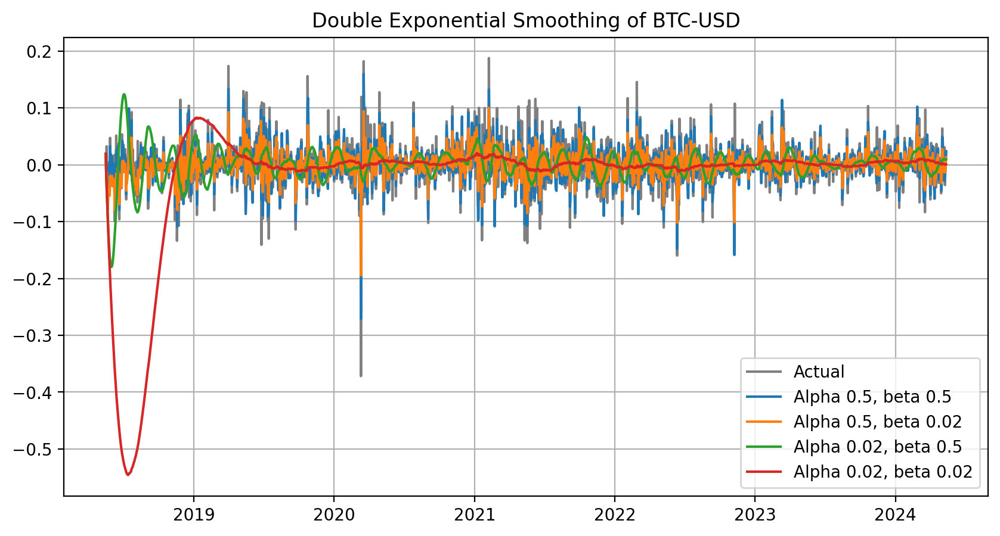

In [ ]:
alpha = [0.5, 0.02]
beta = [0.5, 0.02]


# double_exp_plot(self,df,column,alphas,betas)
# tickers = list(crypto_values.columns[1:])
# for i in range(len(tickers)):
#   preprocessor.double_exp_plot(returns, f'{tickers[i]}',alpha, beta)

returns = returns.dropna().reset_index(drop=True)

preprocessor.double_exp_plot(returns,'BTC-USD',alpha, beta)

In [ ]:
def preprocess_crypto_data(df):
    # Удаление дубликатов и сортировка по дате
    df = df.drop_duplicates(subset='Date')
    df = df.sort_values(by='Date')

    # Установка индекса как дата и преобразование в формат datetime
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')

    # Рассчитать прирост для каждой монеты
    df_pct_change = df.drop(columns=['Date']).pct_change()

    # Предварительная обработка данных
    # Применить скользящее среднее для сглаживания данных (можно заменить на другие методы сглаживания)
    df_smoothed = df_pct_change.rolling(window=7).mean()

    # Изучение взаимосвязей между монетами
    # Вычислить корреляцию между временными рядами цен различных криптовалют
    correlation_matrix = df_smoothed.corr()


    # df = crypto_values.copy()

    # Преобразование столбца 'Date' в тип datetime
    df['Date'] = pd.to_datetime(df['Date'])

    # Установка столбца 'Date' в качестве индекса
    df.set_index('Date', inplace=True)
    monthly_data = df.groupby(pd.Grouper(freq='M'))

    # Вычисление корреляции для каждого месяца
    monthly_correlation = monthly_data.apply(lambda x: x.corr())

    # Исследование динамики корреляций во времени
    # Построить график динамических корреляций по помесячному окну
    monthly_correlation = df_smoothed.resample('M').corr()
    monthly_correlation.plot(figsize=(10, 6))
    plt.title('Динамика корреляций по помесячному окну')
    plt.xlabel('Дата')
    plt.ylabel('Корреляция')
    plt.show()


    # Построить автокорреляционные функции для каждой монеты
    # autocorrelation_plot(df_smoothed)

    # Удалить полностью скоррелированные ряды
    correlated_pairs = np.where(correlation_matrix >= 0.95)
    for pair in zip(*correlated_pairs):
        if pair[0] != pair[1]:
            df_smoothed = df_smoothed.drop(df_smoothed.columns[pair[1]], axis=1)

    # Удалить мало скоррелированные ряды (пример)
    # Можно задать порог корреляции и оставить только те монеты, у которых корреляция выше порогового значения
    threshold = 0.5
    low_correlation_pairs = np.where(correlation_matrix <= threshold)
    for pair in zip(*low_correlation_pairs):
        if pair[0] != pair[1]:
            df_smoothed = df_smoothed.drop(df_smoothed.columns[pair[1]], axis=1)

    return df_smoothed


In [ ]:
crypto_values['Date'] = pd.to_datetime(crypto_values.Date).dt.date
crypto_values.head()

,Date,BTC-USD,ETH-USD,USDT-USD,BNB-USD,XRP-USD,DOGE-USD,ADA-USD,TRX-USD,BCH-USD,...,XEM-USD,GAS-USD,LRC-USD,DCR-USD,ANT-USD,TEL-USD,ABT-USD,ONT-USD,WAVES-USD,PRO-USD
0,2018-05-13,8723.940430,733.495972,1.00325,13.1187,0.745748,0.004329,0.285890,0.075613,1493.119995,...,0.356028,26.652800,0.683685,91.097900,4.57387,0.002088,1.19029,8.22854,6.57223,1.43343
1,2018-05-14,8716.790039,730.549011,1.00127,12.8707,0.740898,0.004460,0.273434,0.072812,1431.689941,...,0.368996,26.110201,0.654747,102.276001,4.31620,0.001991,1.13245,7.95368,6.60185,1.48793
2,2018-05-15,8510.379883,708.870972,1.00114,12.5678,0.698588,0.004515,0.260155,0.068566,1343.380005,...,0.335998,24.195499,0.705083,97.322800,4.09344,0.001943,1.08513,7.81448,6.15425,1.34843
3,2018-05-16,8368.830078,707.049988,0.99995,12.2605,0.714081,0.004385,0.256375,0.071954,1280.619995,...,0.326662,23.772699,0.655667,92.537201,4.25121,0.001933,1.03010,7.33611,6.14829,1.29360
4,2018-05-17,8094.319824,672.656982,1.00019,12.4650,0.667310,0.004188,0.243664,0.067437,1206.170044,...,0.303940,21.629299,0.651298,93.603897,4.00194,0.001863,1.01722,6.78867,5.77118,1.25673


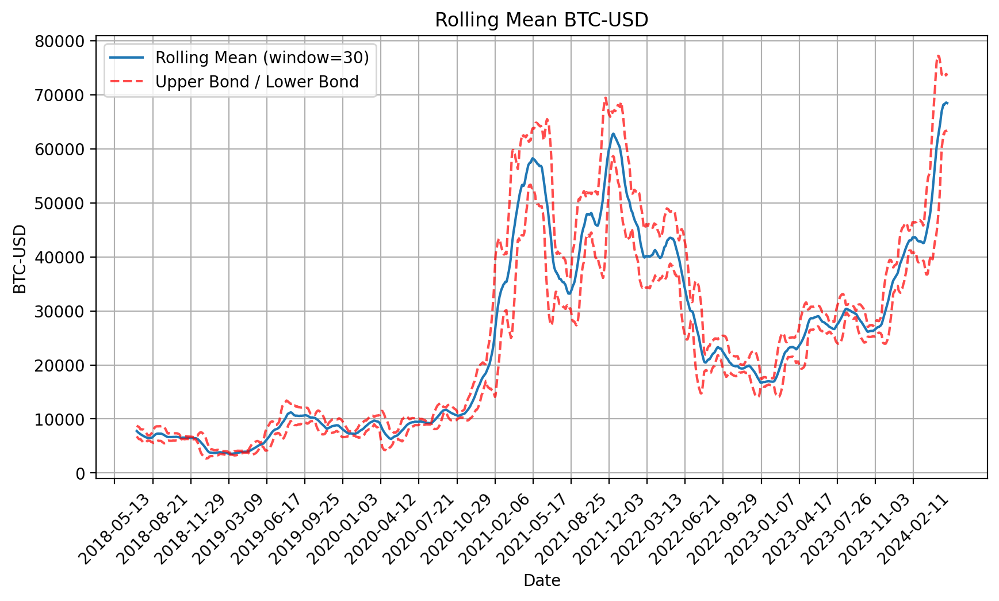

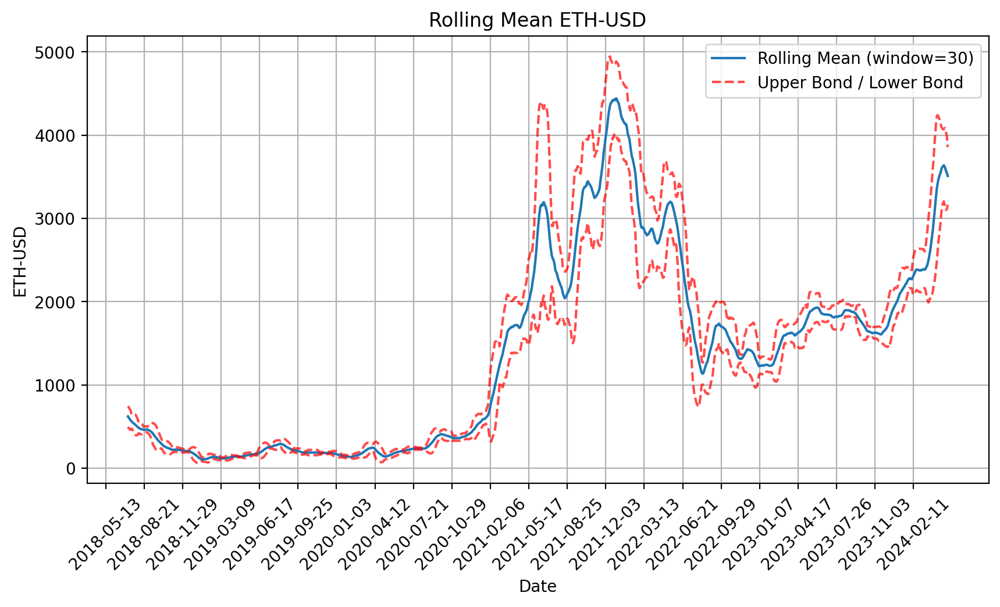

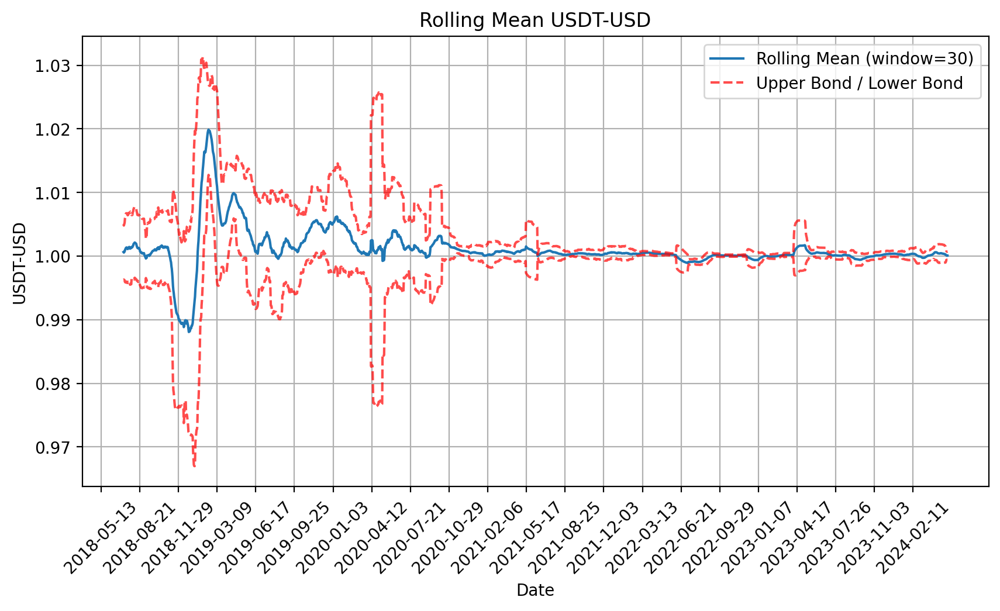

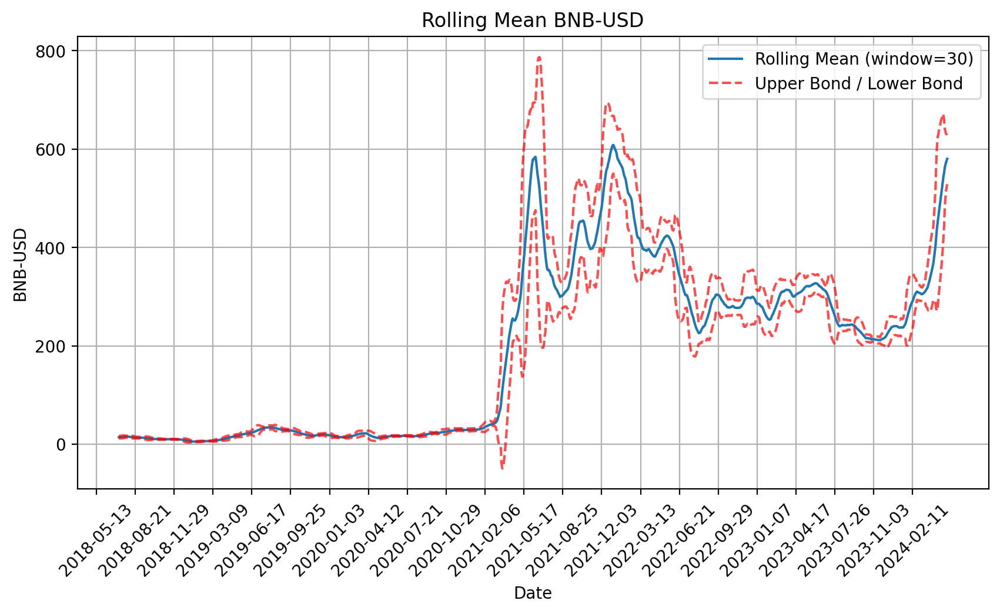

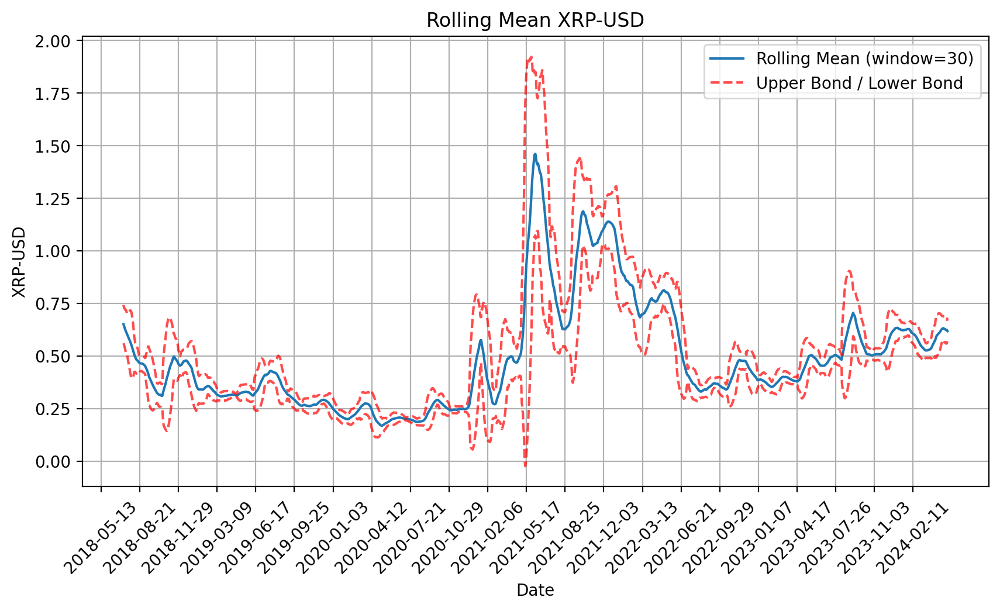

...

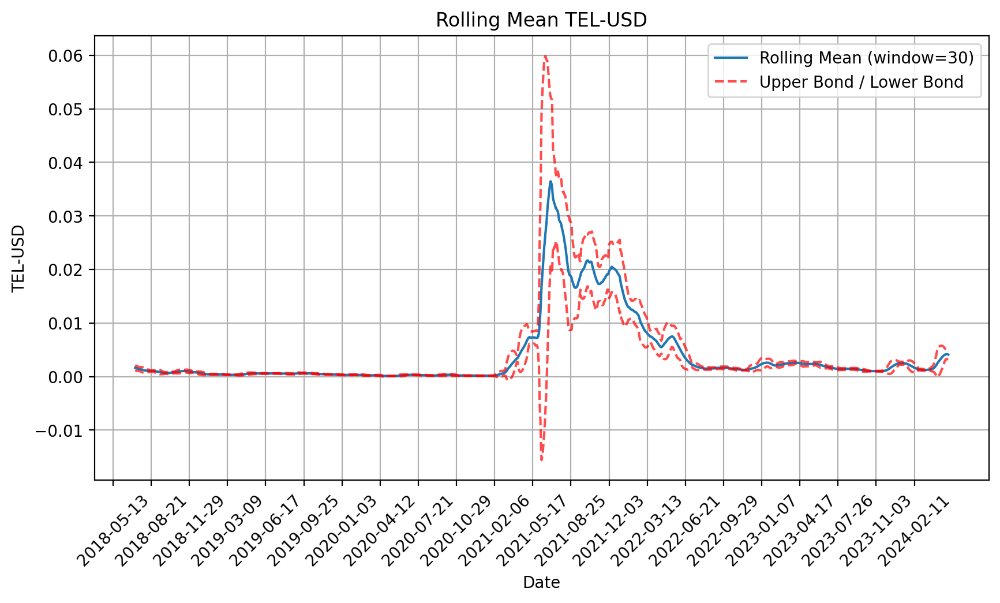

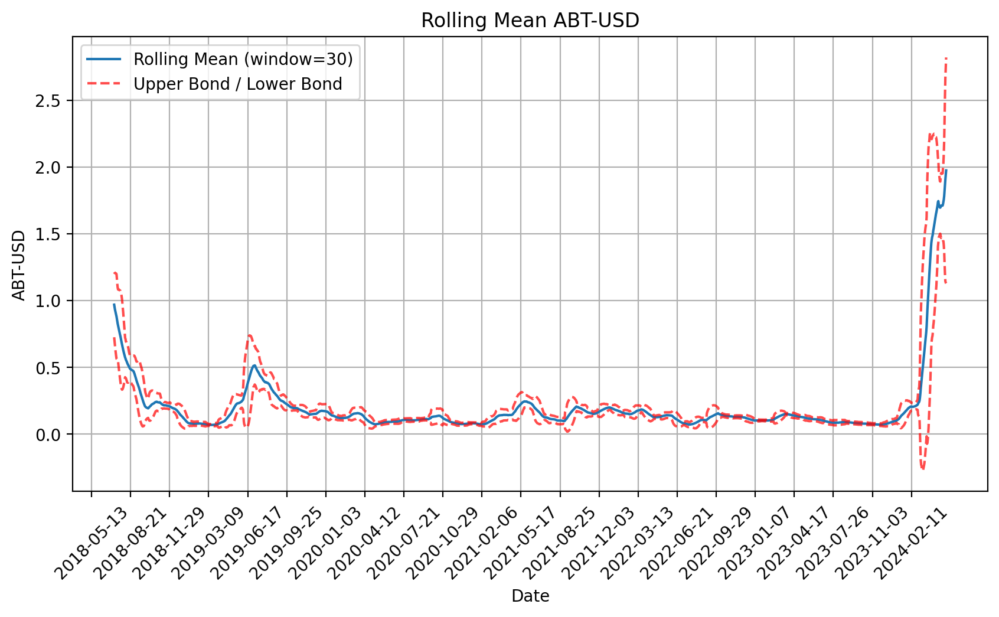

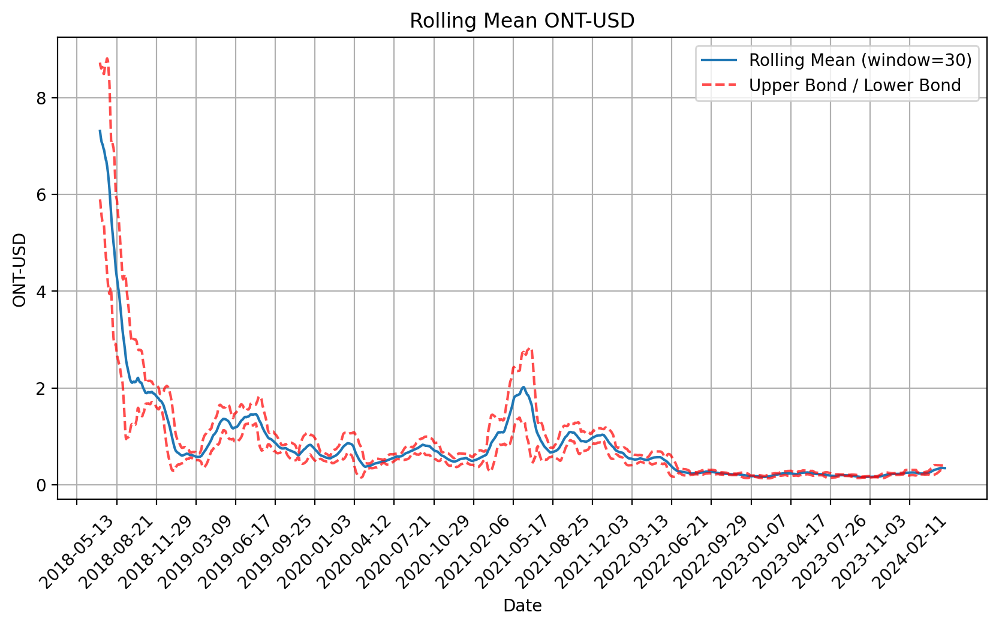

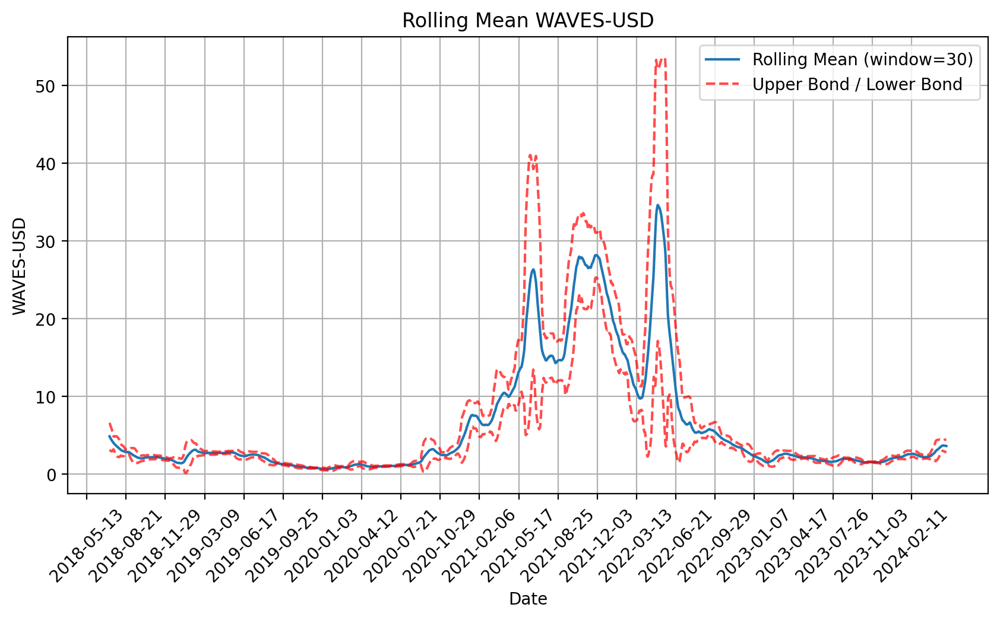

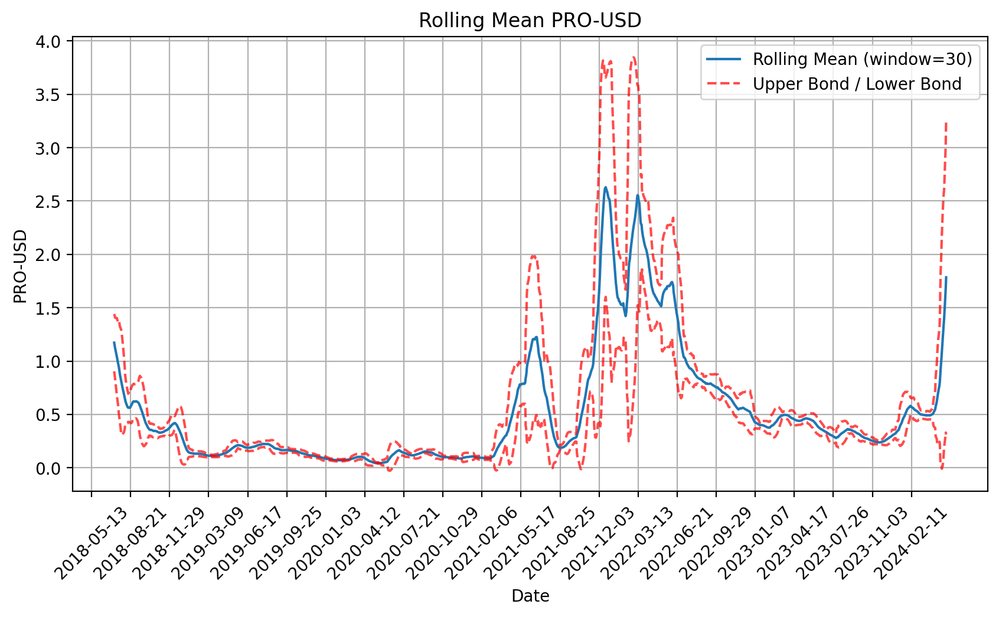

In [ ]:
tickers = list(crypto_values.columns[1:])
for i in range(len(tickers)):
  roll_wind(crypto_values, f'{tickers[i]}',30)